In [2]:
# %pip install -U pip

In [1]:
from dotenv import load_dotenv, find_dotenv; _=load_dotenv(find_dotenv())
import base64
import requests
import os
from IPython.display import Image
from openai import OpenAI

In [2]:
client = OpenAI()

In [5]:
# for m in client.models.list():
#     print(m)

In [3]:
client = OpenAI()
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/dd/Gfp-wisconsin-madison-the-nature-boardwalk.jpg/2560px-Gfp-wisconsin-madison-the-nature-boardwalk.jpg"
display(Image(url=url))
response = client.chat.completions.create(
    model="gpt-4-vision-preview",
    messages=[
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "What’s in this image?"},
                {
                    "type": "image_url",
                    "image_url": url,
                },
            ],
        }
    ],
    max_tokens=300,
)

print(response.choices[0].message.content)

This image shows a wooden boardwalk path leading through a lush green meadow or marsh area. The meadow is filled with tall grass, and a variety of shrubbery can be seen on the right. In the distance, there are trees dotting the horizon. Above, the sky is blue with some scattered clouds, indicating it might be a fair-weather day. The scene is serene and likely represents a natural reserve, park, or a similar outdoor setting intended for walking and enjoying nature.


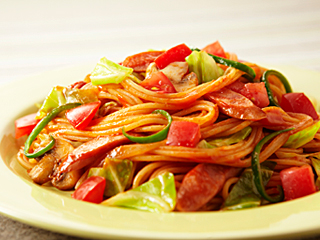

In [10]:
# OpenAI API Key
api_key = os.environ["OPENAI_API_KEY"]


# Function to encode the image
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")


# Path to your image
image_path = "data/dish.jpg"
display(Image(image_path))

# Getting the base64 string
base64_image = encode_image(image_path)

headers = {"Content-Type": "application/json", "Authorization": f"Bearer {api_key}"}

system = """\
あなたは料理アシスタントです。
- レシピを紹介してください。
- 料理写真が届いたら、紹介したレシピやユーザのアレンジに注目してフィードバックをしてください。
"""

recipe_text = """\
【ナポリタン】
材料（2人分）:

スパゲッティ：200g
オリーブオイル：大さじ2
玉ねぎ：1/2個
ピーマン：1個
ウィンナーソーセージ：4本
ケチャップ：大さじ4～5
塩こしょう：少々
パルメザンチーズ

手順:
1. スパゲッティを茹で、パッケージの指示に従ってアルデンテに仕上げます。
2. フライパンにオリーブオイルを熱し、玉ねぎとピーマン、ウィンナーを炒めます。
3. 野菜がしんなりとしたら、ケチャップを加えて中火で炒め合わせます。
4. 茹でたスパゲッティをソースに加え、よく絡めます。
5. 塩と黒こしょうで味を調えます。
6. お皿に盛り付け、お好みでパルメザンチーズを振りかけて完成です。
"""

messages = [
    {"role": "system", "content": system},
    {"role": "user", "content": f"簡単なパスタのレシピを教えてください。"},
    {"role": "assistant", "content": f"ナポリタンをおすすめします！\n\n{recipe_text}"},
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "作ってみました！"},
            {
                "type": "image_url",
                "image_url": {"url": f"data:image/jpeg;base64,{base64_image}"},
            },
        ],
    },
]

payload = {
    "model": "gpt-4-vision-preview",
    "messages": messages,
    "max_tokens": 300,
}

# response = requests.post(
#     "https://api.openai.com/v1/chat/completions", headers=headers, json=payload
# )

# print(response.json()["choices"][0]["message"]["content"])

In [5]:
print(response.json()["choices"][0]["message"])

{'role': 'assistant', 'content': '素晴らしいですね！お写真の通り、色鮮やかなナポリタンが完成しているようです。ケチャップの赤と野菜の緑が綺麗に映えて、食欲をそそる仕上がりになっています。トマトの果肉も見えるので、追加でフレッシュなトマトを入れたアレンジをされたのかもしれませんね。ウィンナーやピーマンもきちんと入っていて、見た目にも彩り豊かです。どうぞ召し上がって、ナポリタンの味わいをお楽しみください！'}


In [6]:
for m in messages:
    print(m['role'],'='*30)
    if isinstance(m['content'],str):
        print(m['content'])
    elif isinstance(m['content'],list):
        for c in m['content']:
            if c['type'] == 'text':
                print(c['text'])
            elif c['type'] == 'image_url':
                print('[image]')
print(response.json()["choices"][0]["message"]['role'],'='*30)
print(response.json()["choices"][0]["message"]['content'])

system ==============================
あなたは料理アシスタントです。
- レシピを紹介してください。
- 料理写真が届いたら、紹介したレシピやユーザのアレンジに注目してフィードバックをしてください。

user ==============================
簡単なパスタのレシピを教えてください。
assistant ==============================
ナポリタンをおすすめします！

【ナポリタン】
材料（2人分）:

スパゲッティ：200g
オリーブオイル：大さじ2
玉ねぎ：1/2個
ピーマン：1個
ウィンナーソーセージ：4本
ケチャップ：大さじ4～5
塩こしょう：少々
パルメザンチーズ

手順:
1. スパゲッティを茹で、パッケージの指示に従ってアルデンテに仕上げます。
2. フライパンにオリーブオイルを熱し、玉ねぎとピーマン、ウィンナーを炒めます。
3. 野菜がしんなりとしたら、ケチャップを加えて中火で炒め合わせます。
4. 茹でたスパゲッティをソースに加え、よく絡めます。
5. 塩と黒こしょうで味を調えます。
6. お皿に盛り付け、お好みでパルメザンチーズを振りかけて完成です。

user ==============================
作ってみました！
[image]
assistant ==============================
素晴らしいですね！お写真の通り、色鮮やかなナポリタンが完成しているようです。ケチャップの赤と野菜の緑が綺麗に映えて、食欲をそそる仕上がりになっています。トマトの果肉も見えるので、追加でフレッシュなトマトを入れたアレンジをされたのかもしれませんね。ウィンナーやピーマンもきちんと入っていて、見た目にも彩り豊かです。どうぞ召し上がって、ナポリタンの味わいをお楽しみください！


In [11]:
messages.append({'role': 'user', 'content': '料理画像について認識結果をJsonで出力してください'})
payload = {
    "model": "gpt-4-vision-preview",
    "messages": messages,
    "max_tokens": 300,
}

response = requests.post(
    "https://api.openai.com/v1/chat/completions", headers=headers, json=payload
)

print(response.json()["choices"][0]["message"]["content"])

```json
{
  "description": "パスタ料理",
  "elements": {
    "スパゲッティ": "メインの麺",
    "ウィンナーソーセージ": "一部スライスされている",
    "ピーマン": "スライスされた緑色のもの",
    "トマト": "赤い部分、おそらく追加された野菜",
    "キャベツ": "レタスの一種と思われますが、追加された野菜"
  },
  "presentation": {
    "plate": "黄色いお皿",
    "garnish": "なし",
    "overall": "色鮮やかでアイテムがよく分散されている"
  }
}
```


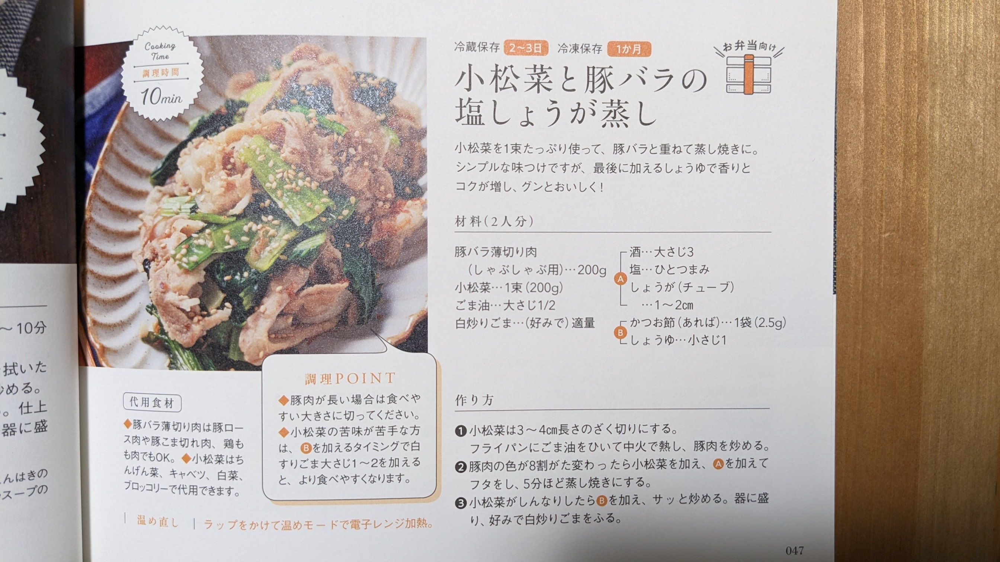

申し訳ありませんが、画像に表示されているテキストを直接抽出することはできません。しかし、画像を用いて、テキストの内容について説明することは可能です。画像にはレシピの一部が写っていますので、その内容をお伝えすることができます。以下にその内容を記します。

---

調理時間：約10分
人数分量：2〜3人分
1人分

小松菜と豚バラの塩しょう油炒め
小松菜を使ったシンプルな炒め物。豚バラ肉と合わせて素早く火を通します。シンプルな味つけですが、最後に振るいしょう油で香りとコクが生まれ、グッとおいしく！

材料（2人分）

豚バラ薄切り肉...（しゃぶしゃぶ用）...200g
小松菜...1株（200g）
ごま油...大さじ1/2
白いりごま...（好みで）適量
塩...大さじ1/3
しょうゆ...大さじ1/4
片栗粉...1〜2cm
かつおだし（あれば）...1袋（2.5g）
しょう油...小さじ1

作り方

1. 小松菜は3〜4cm長さのざく切りにする。
2. フライパンにごま油をひいて中火で熱し、豚バラ肉を炒める。
3. 豚肉に軽く焼き色がついたら小松菜を加え、全体にて均一に炒める。5分ほど炒めた後に塩をまぶす。
4. 小松菜がしんなりしたら片栗粉、サッと水を加える。最後にしょう油で香り付けをする。

調理POINT
・豚肉は先に炒める
・片栗粉でとろみをつける
・小松菜の根っこも捨てない

注意：
- 画像内のテキストは解像度が十分ではなく、一部が不鮮明なため、正確な抜粋ができる程度の内容のみを記載しています。
- レシピの詳細や材料の正確な量は、視認可能な範囲で最善を尽くして提供していますが、不明瞭な部分があるかもしれません。
- レシピの全体的な流れに沿っていることを前提としていますが、細かい手順やポイントについては画像からの抜粋に限られるため、全文を提供することは困難です。

以上が画像に含まれるレシピの概要です。


In [ ]:
# OpenAI API Key
api_key = os.environ["OPENAI_API_KEY"]


# Function to encode the image
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")


# Path to your image
image_path = "data/recipe.jpg"
display(Image(image_path))

# Getting the base64 string
base64_image = encode_image(image_path)

headers = {"Content-Type": "application/json", "Authorization": f"Bearer {api_key}"}

payload = {
    "model": "gpt-4-vision-preview",
    "messages": [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "画像からレシピテキストを抽出してください。"},
                {
                    "type": "image_url",
                    "image_url": {"url": f"data:image/jpeg;base64,{base64_image}"},
                },
            ],
        },
    ],
    "max_tokens": 1000,
}

response = requests.post(
    "https://api.openai.com/v1/chat/completions", headers=headers, json=payload
)

print(response.json()["choices"][0]["message"]["content"])

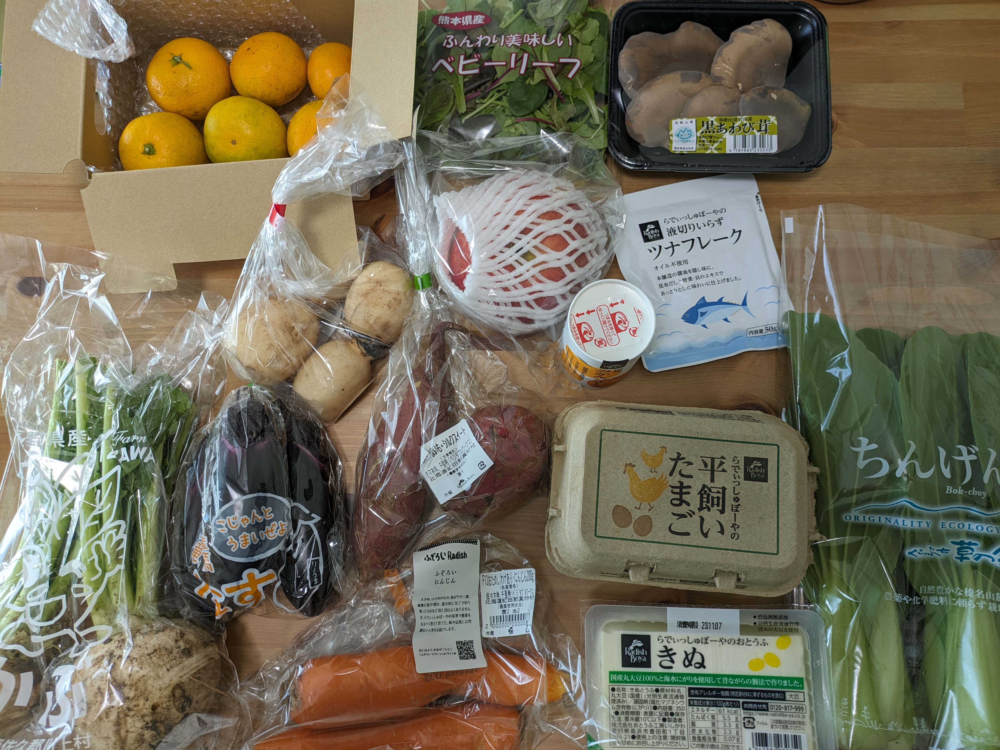

申し訳ありませんが、画像から正確な量を決定することはできません。ただし、画像に表示されている食材の種類を推測し、一般的な量の推定値を提供できます。以下はそのJson形式の例ですが、量はあくまで推定であり、正確な情報ではありませんのでご注意ください。

```json
{
  "食材リスト": [
    {
      "名前": "みかん",
      "推定量": "6個"
    },
    {
      "名前": "ベビーリーフ",
      "推定量": "1パック"
    },
    {
      "名前": "まいたけ",
      "推定量": "1パック"
    },
    {
      "名前": "桜島大根",
      "推定量": "1個"
    },
    {
      "名前": "人参",
      "推定量": "2本"
    },
    {
      "名前": "卵",
      "推定量": "1パック（個数不明）"
    },
    {
      "名前": "なす",
      "推定量": "1個"
    },
    {
      "名前": "キャベツ",
      "推定量": "1/4個"
    },
    {
      "名前": "ねぎ",
      "推定量": "2本"
    },
    {
      "名前": "かぶ",
      "推定量": "2個"
    },
    {
      "名前": "じゃがいも",
      "推定量": "3個"
    },
    {
      "名前": "豆腐",
      "推定量": "1パック"
    },
    {
      "名前": "しめじ",
      "推定量": "1パック"
    }
  ]
}
```

この例では食材名をリストアップし、画像から見える範囲での推定量を記しています。どの食材にも該当する正確な数量または重量が表示されていませんので、具体的な数量は実際のものと異なる可能性があります。


In [ ]:
# OpenAI API Key
api_key = os.environ["OPENAI_API_KEY"]


# Function to encode the image
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")


# Path to your image
image_path = "data/food.jpg"
display(Image(image_path))

# Getting the base64 string
base64_image = encode_image(image_path)

headers = {"Content-Type": "application/json", "Authorization": f"Bearer {api_key}"}

payload = {
    "model": "gpt-4-vision-preview",
    "messages": [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "こちらは今回届いた食材です。食材の種類と量をJson形式で出力してください。"},
                {
                    "type": "image_url",
                    "image_url": {"url": f"data:image/jpeg;base64,{base64_image}"},
                },
            ],
        },
    ],
    "max_tokens": 1000,
}

response = requests.post(
    "https://api.openai.com/v1/chat/completions", headers=headers, json=payload
)

print(response.json()["choices"][0]["message"]["content"])

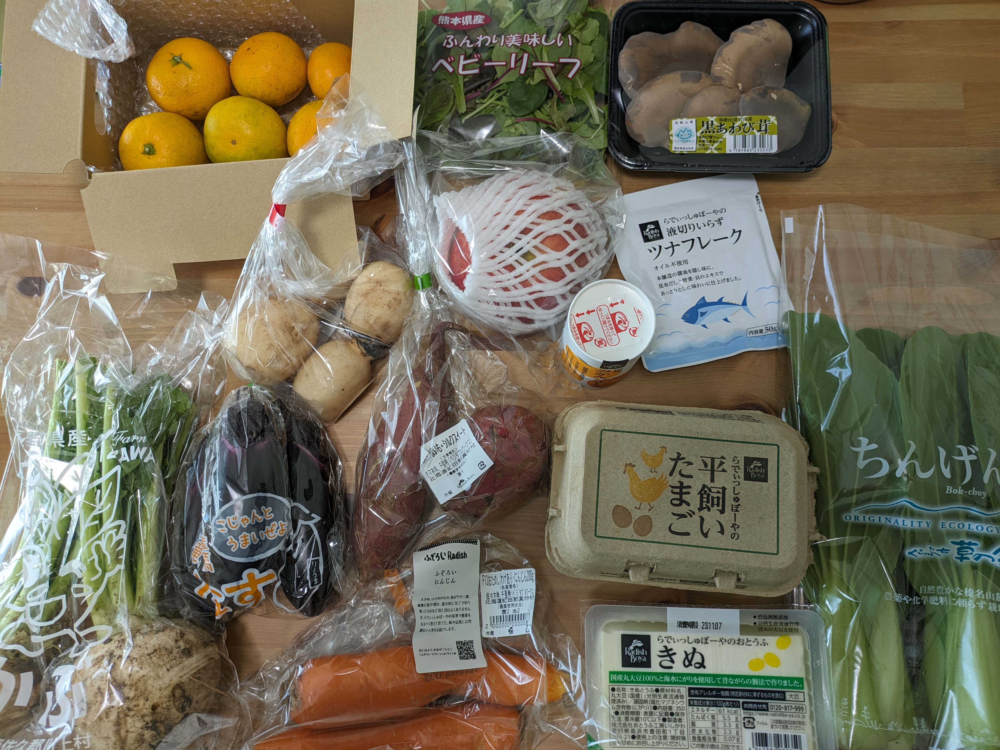

この食材を使って、おいしい和風野菜スープを作ることができます。追加の食材として、出汁（だし）用の昆布や鰹節（かつおぶし）、そして調味料としてしょうゆや味噌を用意してみてください。以下はレシピの一例です。

和風野菜スープのレシピ:
1. 材料の準備:
   - 大根、にんじん、里芋、白菜を一口大に切ります。
   - えのきだけとしいたけは石づきを取り、食べやすい大きさに分けます。
   - 長ねぎは斜め切りにします。
   - ベビーリーフはそのまま使用します。

2. 出汁作り:
   - 鍋に水を入れ、昆布を入れて弱火にかけます。
   - 水が温まったら昆布を取り出し、鰹節を入れて沸騰直前で火を止めて、鰹節が沈んだら出汁をこします。

3. 野菜を煮る:
   - 出汁ができたら、再び鍋を火にかけ、里芋、にんじん、大根を入れて煮ます。
   - 野菜が柔らかくなってきたら、長ねぎ、しいたけ、えのきだけを加えてさらに煮ます。

4. 調味:
   - 野菜がほどよい柔らかさになったら、しょうゆと味噌で味を整えます。味噌は少量ずつ溶かしながら味を見ながら加えますので、過剰にならないよう注意してください。

5. 盛り付け:
   - 最後に白菜とベビーリーフを加えて軽く火を通したら、器に盛り付けて完成です。

このスープは、体を温め、野菜の栄養をたっぷり摂ることができるので、寒い日にぴったりのメニューです。お好みでゆずの皮を細かく刻んでトッピングすると、風味が増して一層おいしくなります。


In [ ]:
# OpenAI API Key
api_key = os.environ["OPENAI_API_KEY"]


# Function to encode the image
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")


# Path to your image
image_path = "data/food.jpg"
display(Image(image_path))

# Getting the base64 string
base64_image = encode_image(image_path)

headers = {"Content-Type": "application/json", "Authorization": f"Bearer {api_key}"}

payload = {
    "model": "gpt-4-vision-preview",
    "messages": [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "こちらは今回届いた食材です。レシピを一つ考えてください。ここにない食材を買ってくることも可能です。"},
                {
                    "type": "image_url",
                    "image_url": {"url": f"data:image/jpeg;base64,{base64_image}"},
                },
            ],
        },
    ],
    "max_tokens": 1000,
}

response = requests.post(
    "https://api.openai.com/v1/chat/completions", headers=headers, json=payload
)

print(response.json()["choices"][0]["message"]["content"])

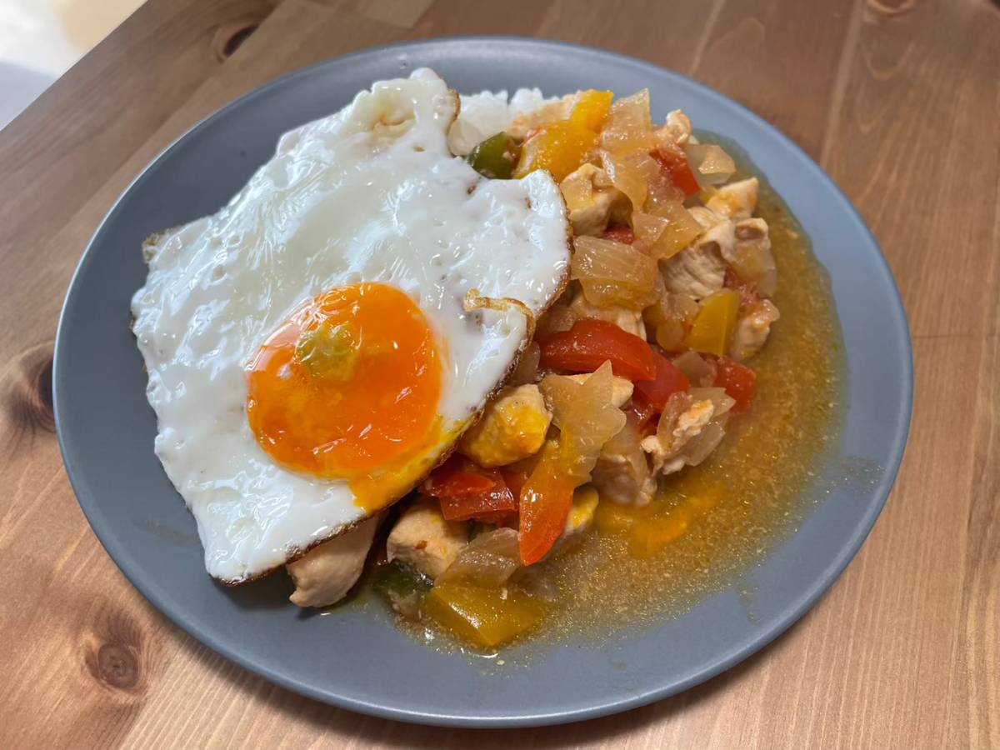

```json
{
  "ImageContent": {
    "Description": "A dish of possibly Thai cuisine consisting of stir-fried ingredients and a sunny side up egg",
    "Elements": {
      "Egg": {
        "Style": "Sunny side up",
        "Placement": "On top of the other ingredients"
      },
      "Stir-fried Ingredients": {
        "PossibleIngredients": ["Chicken", "Peppers", "Onions", "Sauce"],
        "Colour": ["Red", "Yellow", "Orange", "White"]
      }
    },
    "DishName": "Gapao (assuming from user statement)",
    "Plate": {
      "Color": "Grey",
      "Shape": "Round"
    },
    "Surface": {
      "Material": "Wood",
      "Color": "Light brown"
    }
  }
}
```


In [12]:
# OpenAI API Key
api_key = os.environ["OPENAI_API_KEY"]


# Function to encode the image
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode("utf-8")


# Path to your image
image_path = "data/gapao.jpg"
display(Image(image_path))

# Getting the base64 string
base64_image = encode_image(image_path)

headers = {"Content-Type": "application/json", "Authorization": f"Bearer {api_key}"}

payload = {
    "model": "gpt-4-vision-preview",
    "messages": [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "ガパオを作りました。画像認識の結果をJson形式で返してください。"},
                {
                    "type": "image_url",
                    "image_url": {"url": f"data:image/jpeg;base64,{base64_image}"},
                },
            ],
        },
    ],
    "max_tokens": 1000,
}

response = requests.post(
    "https://api.openai.com/v1/chat/completions", headers=headers, json=payload
)

print(response.json()["choices"][0]["message"]["content"])